# 1. Setup

## 1.1. Imports

In [1]:
# Standard lib imports
from pathlib import Path

# Thirdy part imports
import cv2
import numpy as np
from PIL import Image

# Project imports
from viajen import animate
from viajen.utils import move_dimensions

## 1.2. Loading data (a folder with png files of indiviudal frames) and transforming it other types of data accepted by the library

In [2]:
my_folder_str = './images'
my_folder_path_object = Path(my_folder_str)

my_list_of_file_path = sorted(my_folder_path_object.glob('*.png'))
my_list_of_pillow_images = [Image.open(file) for file in my_list_of_file_path]

my_list_of_file_str = [file.as_posix() for file in my_list_of_file_path]
my_list_of_opencv_arrays = [cv2.imread(file) for file in my_list_of_file_str]

my_4D_thwc_array = np.array(my_list_of_opencv_arrays)
my_4D_chwt_array  = move_dimensions(my_4D_thwc_array, 'CHWT', 'THWC')

# 2. Testing functions

## 2.1. animate.folder()

#### From a pathlib object, using defaults...

PosixPath('images')


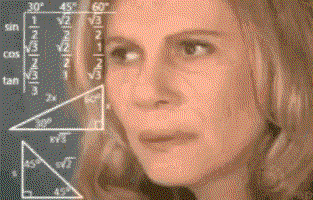

In [3]:
print(my_folder_path_object.__repr__())

animate.folder(my_folder_path_object)

#### ... and with smaller size (max_height) and shorter length (max_frames)

PosixPath('images')


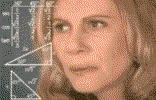

In [4]:
print(my_folder_path_object.__repr__())

animate.folder(my_folder_path_object, max_frames=8, max_height=100)

#### From a string

<class 'str'> ./images


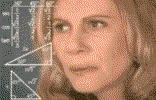

In [5]:
# From a string
print(f'{type(my_folder_str)} {my_folder_str}')

animate.folder(my_folder_str, max_height=100)

## 2.2. animate.file_list()

#### From a list of pathlib objects

<class 'list'> with 46 elements
First element: PosixPath('images/000.png')


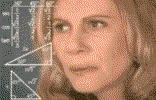

In [6]:
print(f'{type(my_list_of_file_path)} with {len(my_list_of_file_path)} elements')
print(f'First element: {my_list_of_file_path[0].__repr__()}')

animate.file_list(my_list_of_file_path, max_height=100)

#### From a a list of strings

<class 'list'> with 46 elements
First element: <class 'str'> images/000.png


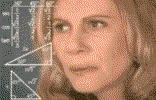

In [7]:
print(f'{type(my_list_of_file_str)} with {len(my_list_of_file_str)} elements')
print(f'First element: {type(my_list_of_file_str[0])} {my_list_of_file_str[0]}')

animate.file_list(my_list_of_file_str, max_height=100)

## 2.3. animate.pillow_list()

#### From a a list of pillow images

<class 'list'> with 46 elements
First element: <PIL.PngImagePlugin.PngImageFile image mode=RGB size=313x200 at 0x7F1ADF2C9580>


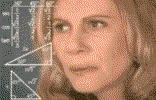

In [8]:
print(f'{type(my_list_of_pillow_images)} with {len(my_list_of_pillow_images)} elements')
print(f'First element: {str(my_list_of_pillow_images[0])}')

animate.pillow_list(my_list_of_pillow_images, max_height=100)

## 2.4. animate.array_list()

#### From a list of BGR (Blue, Green, Red) arrays created by opencv, without setting the BGR flag...

<class 'list'> with 46 elements
First element: <class 'numpy.ndarray'> Shape (200, 313, 3)


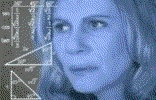

In [9]:
print(f'{type(my_list_of_opencv_arrays)} with {len(my_list_of_opencv_arrays)} elements')
print(f'First element: {type(my_list_of_opencv_arrays[0])} Shape {my_list_of_opencv_arrays[0].shape}')

animate.array_list(my_list_of_opencv_arrays, max_height=100)

#### ... and setting the BGR flag

<class 'list'> with 46 elements
First element: <class 'numpy.ndarray'> Shape (200, 313, 3)


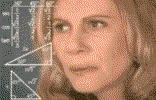

In [10]:
print(f'{type(my_list_of_opencv_arrays)} with {len(my_list_of_opencv_arrays)} elements')
print(f'First element: {type(my_list_of_opencv_arrays[0])} Shape {my_list_of_opencv_arrays[0].shape}')

animate.array_list(my_list_of_opencv_arrays, BGR=True, max_height=100)

## 2.5. animate.array_4d()

#### From a list of THWC (Time, Height, Width, Color channel) 4D array created by stacking opencv frames, without setting the BGR flag...

<class 'numpy.ndarray'> Shape (46, 200, 313, 3)


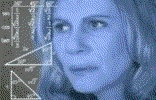

In [11]:
print(f'{type(my_4D_thwc_array)} Shape {my_4D_thwc_array.shape}')

animate.array_4d(my_4D_thwc_array, max_height=100)

#### ... and setting the BGR flag

<class 'numpy.ndarray'> Shape (46, 200, 313, 3)


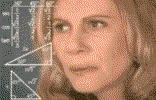

In [12]:
print(f'{type(my_4D_thwc_array)} Shape {my_4D_thwc_array.shape}')

animate.array_4d(my_4D_thwc_array, BGR=True, max_height=100)

#### From a list of CHWT (Color channel, Height, Width, Time) 4D array created by stacking opencv frames, setting the BGR flag

<class 'numpy.ndarray'> Shape (3, 200, 313, 46)


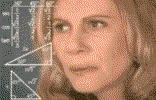

In [13]:
print(f'{type(my_4D_chwt_array)} Shape {my_4D_chwt_array.shape}')

animate.array_4d(my_4D_chwt_array, array4d_dims='CHWT', BGR=True, max_height=100)